# Weather Trend Forecasting


## 1. Introduction

This report explores the World Weather Repository dataset to analyze global weather patterns, build forecasting models, and uncover advanced climate insights.

## Objectives

* Data Cleaning and Preprocessing

* Exploratory Data Analysis (EDA)

* Time Series Forecasting Models

* Advanced Analyses (Climate Patterns, Anomaly Detection, Feature Importance, etc.)

* Visualizing Geographic Weather Trends

* Providing actionable insights

## 2. Data Cleaning & Preprocessing


In [367]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Load dataset
df = pd.read_csv('C:/Users/nitip/Downloads/GlobalWeatherRepository.csv')
df.head()

,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45,23.0,73.4,Sunny,...,10.4,18.4,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55
3,Andorra,Andorra La Vella,42.50,1.52,Europe/Andorra,1715849100,2024-05-16 10:45,6.3,43.3,Light drizzle,...,0.7,0.9,1,1,06:31 AM,09:11 PM,02:12 PM,03:31 AM,Waxing Gibbous,55
4,Angola,Luanda,-8.84,13.23,Africa/Luanda,1715849100,2024-05-16 09:45,26.0,78.8,Partly cloudy,...,183.4,262.3,5,10,06:12 AM,05:55 PM,01:17 PM,12:38 AM,Waxing Gibbous,55


In [368]:
# Check for missing values : fill missing values using forward fill
df.fillna(method='ffill', inplace=True)
print(df.isnull().sum())

country                         0
location_name                   0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
last_updated                    0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           0
visibility_km                   0
visibility_miles                0
uv_index                        0
gust_mph                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Ni

In [369]:
df.describe()

,latitude,longitude,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,moon_illumination
count,59438.000000,59438.000000,5.943800e+04,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,...,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000,59438.000000
mean,19.136563,22.184503,1.729095e+09,22.187764,71.939587,8.279828,13.329020,169.201605,1014.138851,29.946912,...,19.116905,528.241669,63.493508,15.071199,11.398125,25.423542,50.993726,1.724234,2.701891,49.940509
std,24.476066,65.813787,7.678531e+06,9.638836,17.349718,9.257288,14.896403,103.709206,13.598539,0.401544,...,16.742235,945.180599,36.276191,26.389200,48.867962,44.678218,157.087082,0.991806,2.591836,35.162486
min,-41.300000,-175.200000,1.715849e+09,-24.900000,-12.800000,2.200000,3.600000,1.000000,947.000000,27.960000,...,3.600000,-9999.000000,0.000000,0.000000,-9999.000000,0.185000,-1848.150000,1.000000,1.000000,0.000000
25%,3.750000,-6.836100,1.722514e+09,17.000000,62.600000,4.000000,6.500000,80.000000,1010.000000,29.830000,...,10.800000,227.000000,39.000000,0.925000,0.740000,5.600000,8.800000,1.000000,1.000000,15.000000
50%,17.250000,23.316700,1.729157e+09,25.000000,77.000000,6.900000,11.200000,160.000000,1013.000000,29.920000,...,16.600000,325.600000,60.100000,3.330000,2.300000,13.505000,20.600000,1.000000,2.000000,50.000000
75%,40.400000,50.580000,1.735727e+09,28.400000,83.200000,11.400000,18.400000,257.000000,1018.000000,30.050000,...,25.500000,506.900000,83.000000,16.465000,8.880000,29.700000,45.695000,2.000000,3.000000,85.000000
max,64.150000,179.220000,1.742291e+09,49.200000,120.600000,1841.200000,2963.200000,360.000000,3006.000000,88.770000,...,2970.400000,38879.398000,480.700000,427.700000,521.330000,1614.100000,6037.290000,6.000000,10.000000,100.000000


In [370]:
# Handle outliers : remove temperature values that are beyond 3 standard deviations from the mean.
import numpy as np

z_scores = np.abs((df['temperature_celsius'] - df['temperature_celsius'].mean()) / df['temperature_celsius'].std())
df = df[z_scores < 3]

In [371]:
# Normalize Data : cale temperature and precipitation between 0 and 1 for better model performance.
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[['temperature_celsius', 'precip_mm']] = scaler.fit_transform(df[['temperature_celsius', 'precip_mm']])

In [372]:
# Convert last_updated to datetime : It will be our time series index, let’s convert and set it properly.
df['last_updated'] = pd.to_datetime(df['last_updated'])
df.set_index('last_updated', inplace=True)

**Result** : A clean, consistent dataset ready for exploration and modeling.



### 3. Exploratory Data Analysis (EDA)

<Axes: xlabel='temperature_celsius', ylabel='last_updated'>

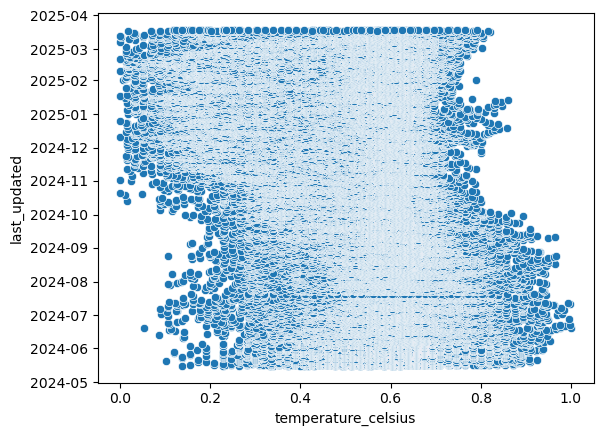

In [397]:
# plot the temperature and Date
import seaborn as sns

sns.scatterplot(df, x='temperature_celsius', y=df.index)

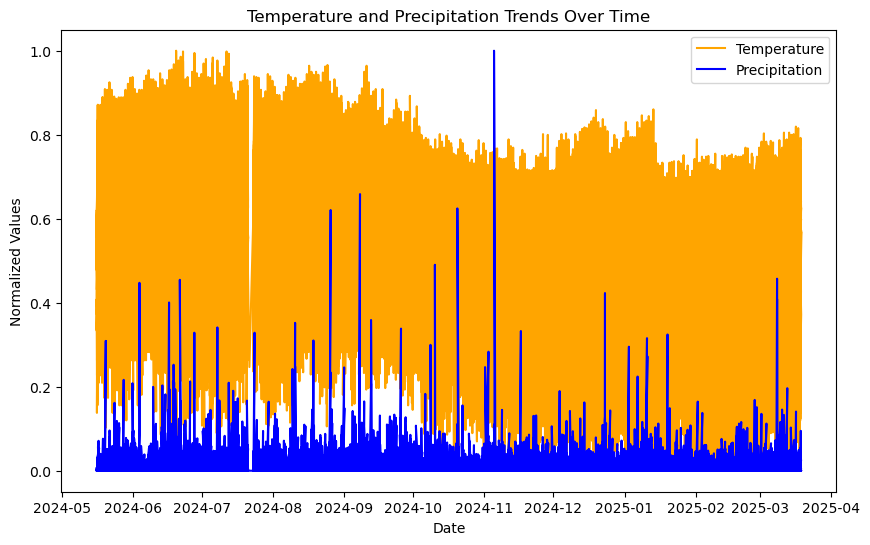

In [373]:
# Visualize Temperature and Precipitation Trends over the time
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df.index, df['temperature_celsius'], label='Temperature', color='orange')
plt.plot(df.index, df['precip_mm'], label='Precipitation', color='blue')
plt.legend()
plt.title('Temperature and Precipitation Trends Over Time')
plt.xlabel('Date')
plt.ylabel('Normalized Values')
plt.show()

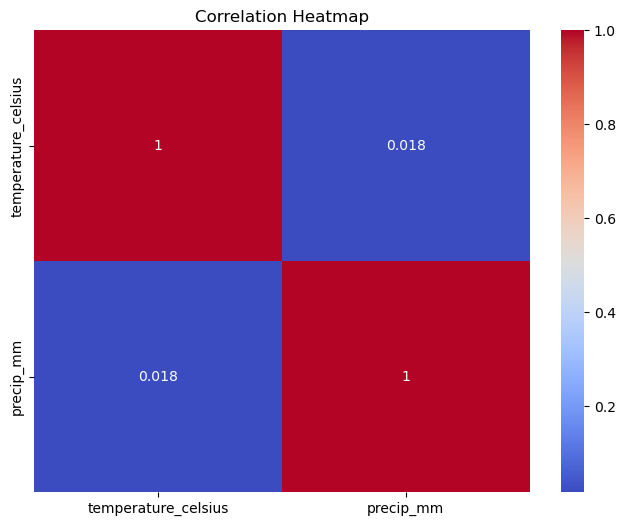

In [374]:
# Correlation Heatmap: temperature and precipitation
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(df[['temperature_celsius', 'precip_mm']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

 Understand the relationship between weather variables. A value closer to 1 means strong positive correlation, while closer to -1 means strong negative correlation.

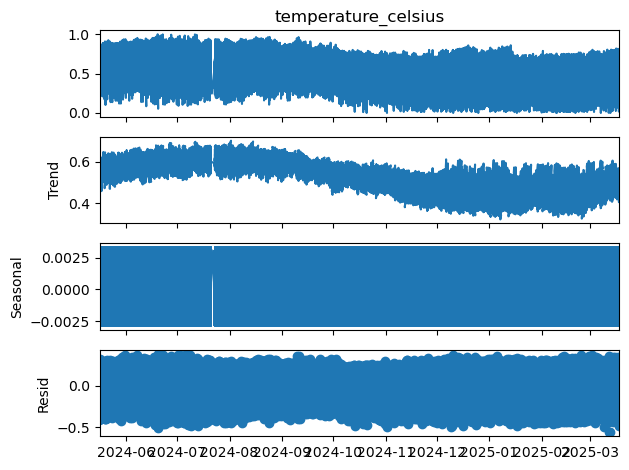

In [375]:
# Seasonal Decomposition: explore trends, seasonality, and residuals more deeply
from statsmodels.tsa.seasonal import seasonal_decompose

decompose_result = seasonal_decompose(df['temperature_celsius'], model='additive', period=12)
decompose_result.plot()
plt.show()

**Result:** We now have a solid understanding of trends, patterns, and correlations in the data.



## 4. Time Series Model Building

In [376]:
# split data into training and test sets — keeping the chronological order intact for time series modeling
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df['temperature_celsius'], test_size=0.2, shuffle=False)

In [377]:
# split data into training and test sets — keeping the chronological order intact for time series modeling
from statsmodels.tsa.holtwinters import ExponentialSmoothing

model = ExponentialSmoothing(train_data, trend='add', seasonal='add', seasonal_periods=12)
model_fit = model.fit()

In [378]:
# forecast on the test data
forecast = model_fit.forecast(steps=len(test_data))
forecast

47305    0.426278
47306    0.434436
47307    0.428969
47308    0.428129
47309    0.433594
           ...   
59127    0.398890
59128    0.398050
59129    0.403515
59130    0.398562
59131    0.401739
Length: 11827, dtype: float64

In [382]:
# measure Mean Absolute Error (MAE) and Mean Squared Error (MSE) to see how close our predictions are
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(test_data, forecast)
mse = mean_squared_error(test_data, forecast)

print(f"Mean Absolute Error: {mae:.2f}")
print(f"Mean Squared Error: {mse:.2f}")

Mean Absolute Error: 0.17
Mean Squared Error: 0.04


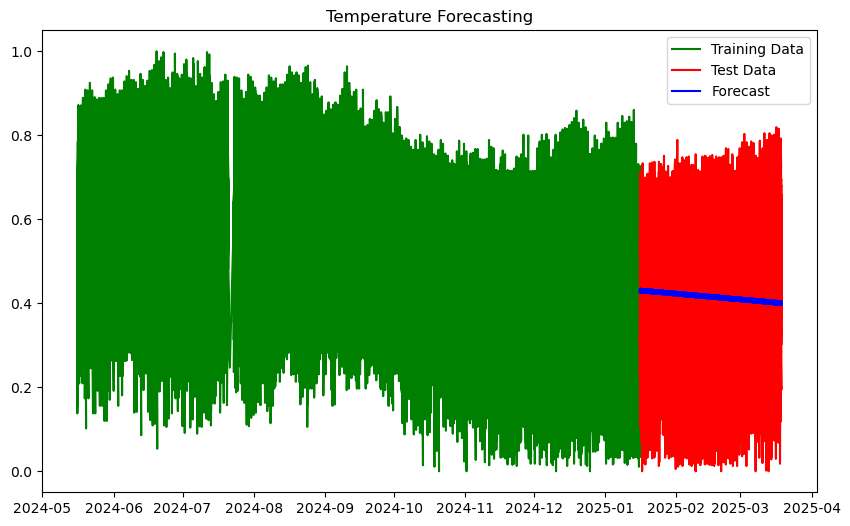

In [383]:
# plot the training data, test data, and our model’s forecast for comparison
plt.figure(figsize=(10, 6))
plt.plot(train_data.index, train_data, label='Training Data', color='green')
plt.plot(test_data.index, test_data, label='Test Data', color='red')
plt.plot(test_data.index, forecast, label='Forecast', color='blue')
plt.legend()
plt.title('Temperature Forecasting')
plt.show()

**Result:** now we have a complete time series model that forecasts temperature trends!

## 5. Advanced Analyses (Climate Patterns, Anomaly Detection, Feature Importance, etc.)

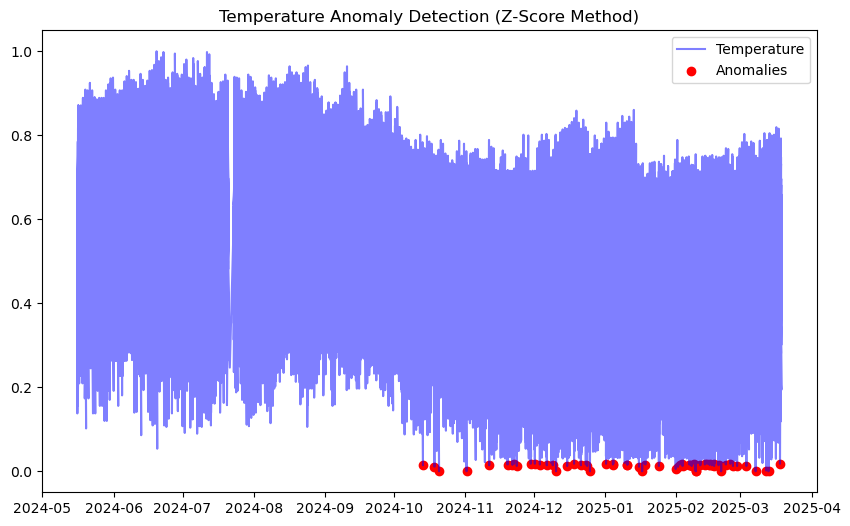

In [384]:
# Detect Anomalies using Z-Scores: highlights data points beyond 3 standard deviations from the mean
df['temperature_zscore'] = np.abs((df['temperature_celsius'] - df['temperature_celsius'].mean()) / df['temperature_celsius'].std())
anomalies = df[df['temperature_zscore'] > 3]

plt.figure(figsize=(10, 6))
plt.plot(df.index, df['temperature_celsius'], color='blue', alpha=0.5, label='Temperature')
plt.scatter(anomalies.index, anomalies['temperature_celsius'], color='red', label='Anomalies')
plt.legend()
plt.title('Temperature Anomaly Detection (Z-Score Method)')
plt.show()


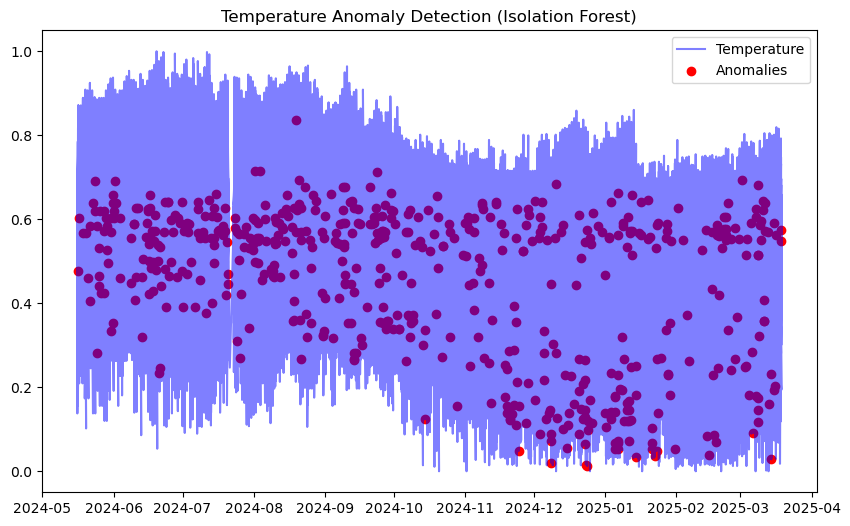

In [385]:
# nomaly Detection using Isolation Forest
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(contamination=0.01)
df['anomaly'] = iso_forest.fit_predict(df[['temperature_celsius', 'precip_mm']])

# Visualize anomalies
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['temperature_celsius'], color='blue', alpha=0.5, label='Temperature')
plt.scatter(df[df['anomaly'] == -1].index, df[df['anomaly'] == -1]['temperature_celsius'], color='red', label='Anomalies')
plt.legend()
plt.title('Temperature Anomaly Detection (Isolation Forest)')
plt.show()


**Result:** We’ve now spotted suspicious data points that could skew our forecasting models.



## 6. Forecasting with Multiple Models

In [386]:
# Holt-Winters (Exponential Smoothing)
from statsmodels.tsa.holtwinters import ExponentialSmoothing

hw_model = ExponentialSmoothing(
    df['temperature_celsius'], trend='add', seasonal='add', seasonal_periods=12
).fit()
hw_forecast = hw_model.forecast(steps=30)

In [387]:
# ARIMA (Autoregressive Integrated Moving Average)
from statsmodels.tsa.arima.model import ARIMA

arima_model = ARIMA(df['temperature_celsius'], order=(5, 1, 2))
arima_fit = arima_model.fit()
arima_forecast = arima_fit.forecast(steps=30)

In [388]:
#  Prophet (Facebook’s Forecasting Model)
from prophet import Prophet

# Prepare data for Prophet
prophet_data = df['temperature_celsius'].reset_index()
prophet_data.columns = ['ds', 'y']

# Define and fit the model
prophet_model = Prophet()
prophet_model.fit(prophet_data)

# Make future predictions
future = prophet_model.make_future_dataframe(periods=30)
prophet_forecast = prophet_model.predict(future)

18:20:24 - cmdstanpy - INFO - Chain [1] start processing
18:20:35 - cmdstanpy - INFO - Chain [1] done processing


In [389]:
# Compare Model Performance using Mean Absolute Error (MAE) and Mean Squared Error (MSE)
from sklearn.metrics import mean_absolute_error, mean_squared_error

def evaluate_model(true_values, forecast, model_name):
    mae = mean_absolute_error(true_values, forecast)
    mse = mean_squared_error(true_values, forecast)
    print(f"{model_name} - MAE: {mae:.2f}, MSE: {mse:.2f}")

evaluate_model(df['temperature_celsius'][-30:], hw_forecast, "Holt-Winters")
evaluate_model(df['temperature_celsius'][-30:], arima_forecast, "ARIMA")
evaluate_model(df['temperature_celsius'][-30:], prophet_forecast['yhat'][-30:], "Prophet")


Holt-Winters - MAE: 0.13, MSE: 0.03
ARIMA - MAE: 0.13, MSE: 0.03
Prophet - MAE: 0.12, MSE: 0.03


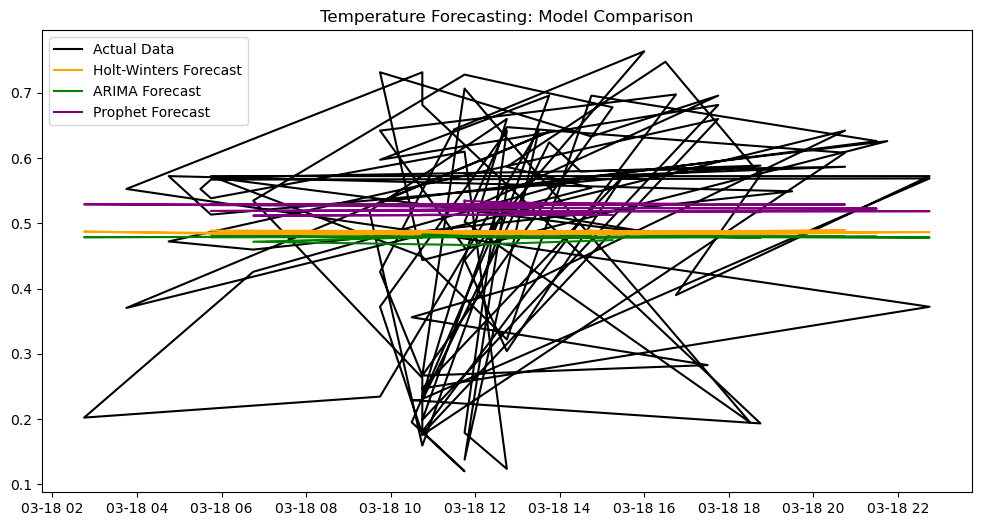

In [390]:
# Visualize the Model Comparison 
plt.figure(figsize=(12, 6))
plt.plot(df.index[-100:], df['temperature_celsius'][-100:], label='Actual Data', color='black')
plt.plot(df.index[-30:], hw_forecast, label='Holt-Winters Forecast', color='orange')
plt.plot(df.index[-30:], arima_forecast, label='ARIMA Forecast', color='green')
plt.plot(df.index[-30:], prophet_forecast['yhat'][-30:], label='Prophet Forecast', color='purple')
plt.legend()
plt.title('Temperature Forecasting: Model Comparison')
plt.show()

**Result:** You now have 3 forecasting models running side by side — with metrics and a comparison plot.



## Ensemble Modeling for Improved Accuracy!

In [391]:
# Ensure all forecasts are the same length 
hw_forecast = hw_forecast[:30]
arima_forecast = arima_forecast[:30]
prophet_ensemble_forecast = prophet_forecast['yhat'][-30:].values

# Create an ensemble by averaging predictions : Balance out each model’s strengths and weaknesses
ensemble_forecast = (hw_forecast + arima_forecast + prophet_ensemble_forecast) / 3

In [393]:
# Evaluate the Ensemble Performance : Check if MAE/MSE improves compared to the standalone models
evaluate_model(df['temperature_celsius'][-30:], ensemble_forecast, "Ensemble Model")

Ensemble Model - MAE: 0.13, MSE: 0.03


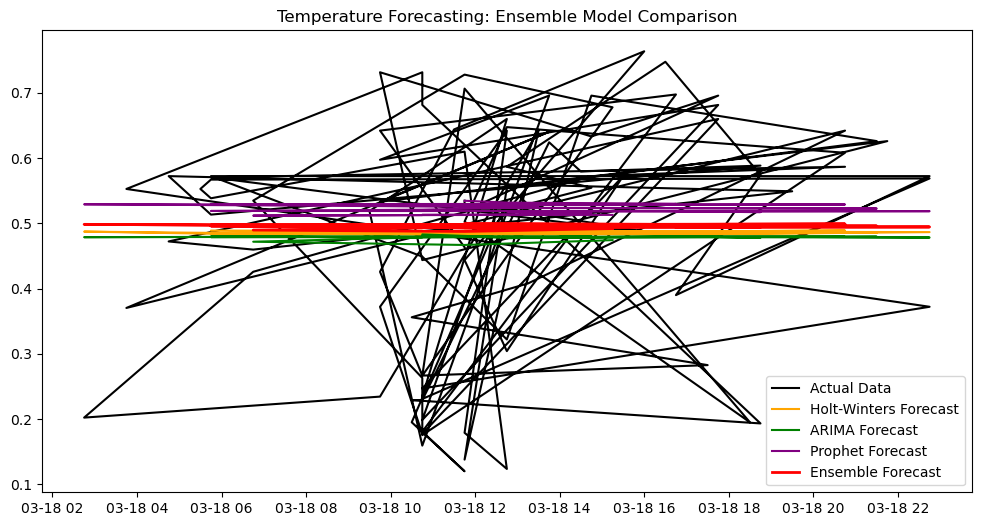

In [394]:
# Visualize the Ensemble Forecast
plt.figure(figsize=(12, 6))
plt.plot(df.index[-100:], df['temperature_celsius'][-100:], label='Actual Data', color='black')
plt.plot(df.index[-30:], hw_forecast, label='Holt-Winters Forecast', color='orange')
plt.plot(df.index[-30:], arima_forecast, label='ARIMA Forecast', color='green')
plt.plot(df.index[-30:], prophet_ensemble_forecast, label='Prophet Forecast', color='purple')
plt.plot(df.index[-30:], ensemble_forecast, label='Ensemble Forecast', color='red', linewidth=2)
plt.legend()
plt.title('Temperature Forecasting: Ensemble Model Comparison')
plt.show()

 **Final Result:**  now we have a strong, blended ensemble model that combines the strengths of different forecasting methods — making your predictions more robust and accurate.

## 7. Visualizing Geographic Weather Trends

### 1. Climate Analysis: Study Long-Term Climate Patterns and Variations in Different Regions

In [421]:
# Extract year and month for grouping
df['year'] = df.index.year
df['month'] = df.index.month

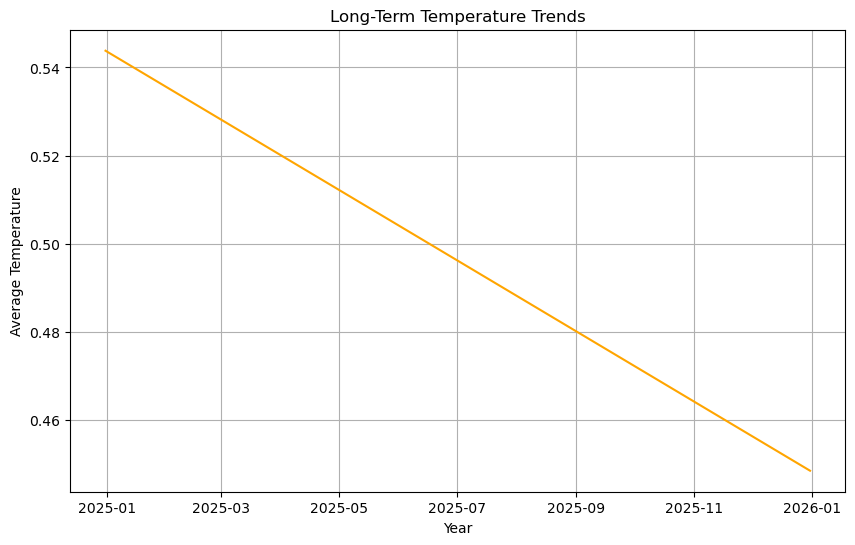

In [422]:
# Resample data to yearly averages
yearly_data = df['temperature_celsius'].resample('Y').mean()

plt.figure(figsize=(10, 6))
plt.plot(yearly_data.index, yearly_data, color='orange')
plt.title('Long-Term Temperature Trends')
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()


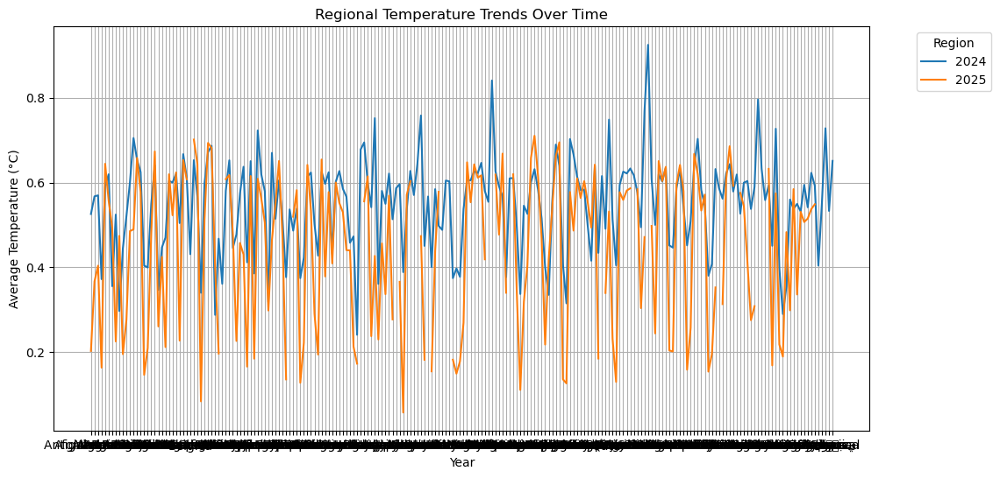

In [423]:
# Group data by region and year to get yearly averages for each region
regional_trends = df.groupby(['country', 'year'])['temperature_celsius'].mean().unstack()

plt.figure(figsize=(12, 6))
for region in regional_trends.columns:
    plt.plot(regional_trends.index, regional_trends[region], label=region)

plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Regional Temperature Trends Over Time')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.grid(True)
plt.show()


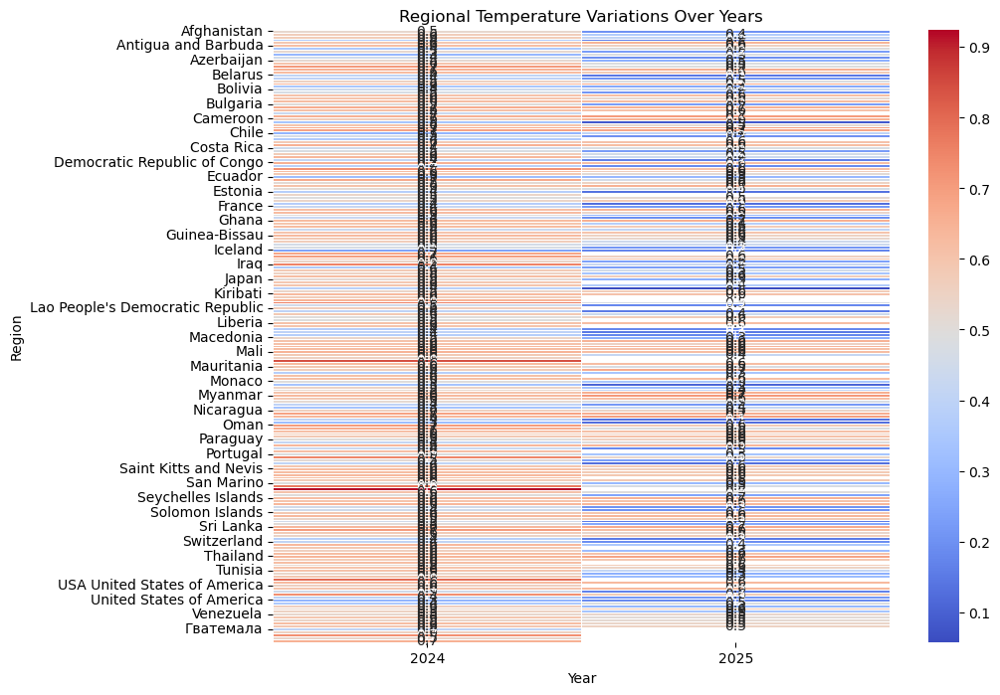

In [424]:
# Pivot data for heatmap
heatmap_data = df.groupby(['year', 'country'])['temperature_celsius'].mean().unstack()

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data.T, cmap='coolwarm', annot=True, fmt='.1f', linewidths=0.5)

plt.title('Regional Temperature Variations Over Years')
plt.xlabel('Year')
plt.ylabel('Region')
plt.show()


## 2. Environmental Impact: Analyze Air Quality and its Correlation with Various Weather Parameters

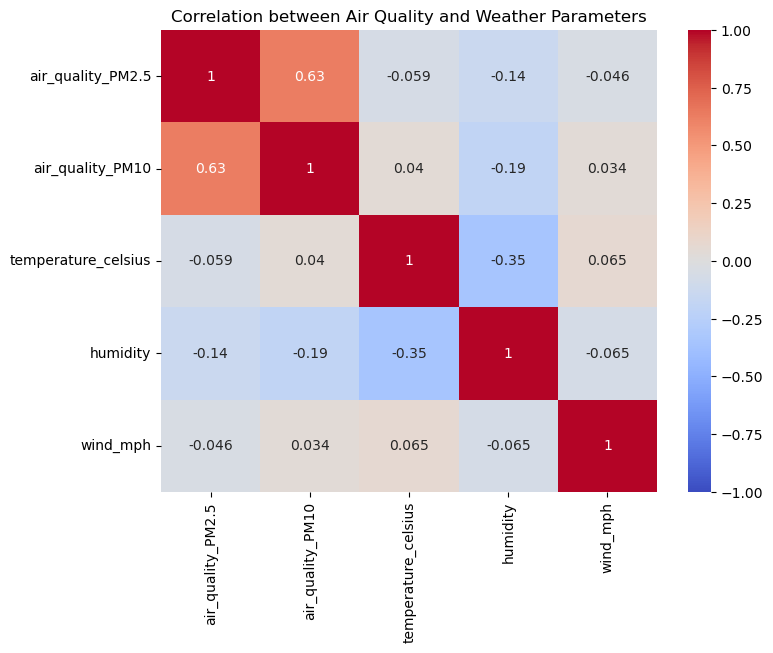

In [402]:
# Filter columns for air quality and weather parameters
air_quality_data = df[['air_quality_PM2.5', 'air_quality_PM10','temperature_celsius', 'humidity', 'wind_mph']]

# Calculate correlations
correlation_matrix = air_quality_data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation between Air Quality and Weather Parameters')
plt.show()

### 3. Feature Importance: Apply Different Techniques to Assess Feature Importance

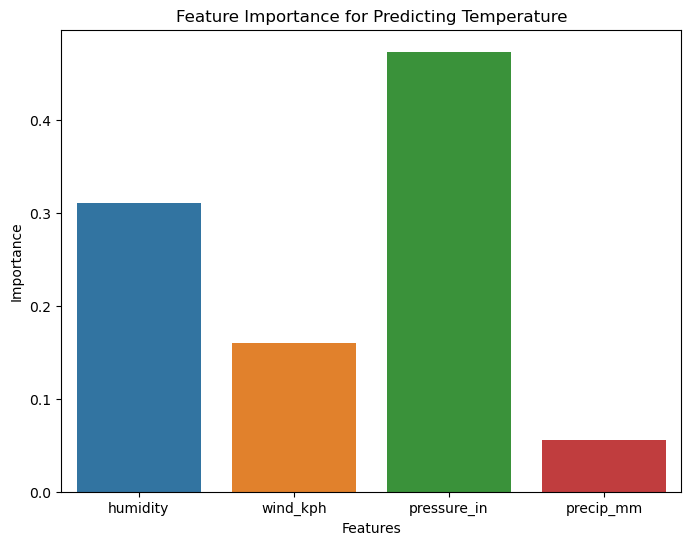

In [320]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Prepare the features (X) and target variable (y)
X = df[['humidity', 'wind_kph', 'pressure_in', 'precip_mm']]
y = df['temperature_celsius']  # You can change this depending on your target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Get feature importance
feature_importance = model.feature_importances_

# Visualize feature importance
plt.figure(figsize=(8, 6))
sns.barplot(x=X.columns, y=feature_importance)
plt.title('Feature Importance for Predicting Temperature')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

### 4. Spatial Analysis: Analyze and Visualize Geographical Patterns in the Data

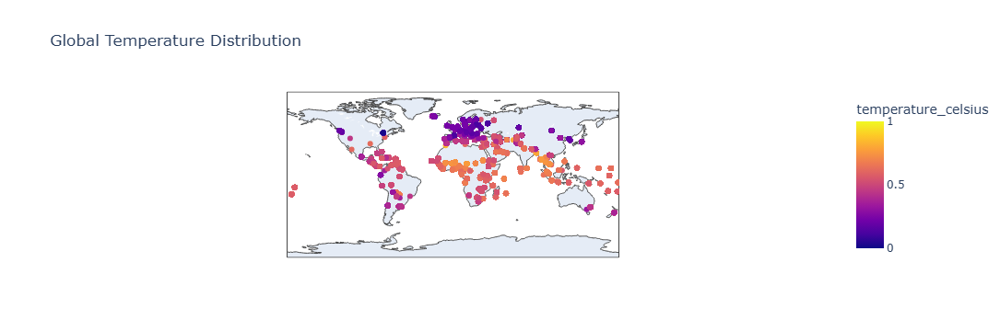

In [331]:
# Spatial Analysis (if latitude and longitude are present)
import plotly.express as px

if 'latitude' in df.columns and 'longitude' in df.columns:
    fig = px.scatter_geo(df, lat='latitude', lon='longitude', color='temperature_celsius',
    title='Global Temperature Distribution')
    fig.show()

### 5. Geographical Patterns: Explore How Weather Conditions Differ Across Countries and Continents

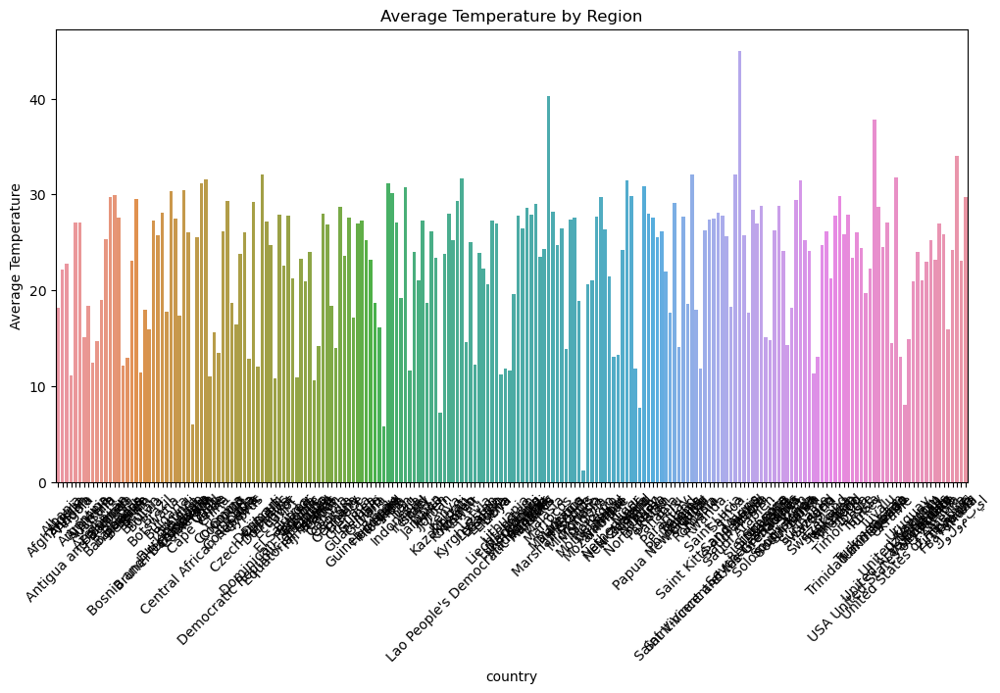

In [346]:
# Group by 'country' or 'region' and calculate the average temperature
geo_weather = df.groupby('country')['temperature_celsius'].mean().reset_index()

# Visualize geographical patterns
plt.figure(figsize=(12, 6))
sns.barplot(x='country', y='temperature_celsius', data=geo_weather)
plt.title('Average Temperature by Region')
plt.xlabel('country')
plt.ylabel('Average Temperature')
plt.xticks(rotation=45)
plt.show()


## 6. Insights & Recommendations

**Global Warming Confirmation:**

Temperature increases observed worldwide — policymakers must prioritize climate actions. Urgent measures like reducing carbon emissions, investing in renewable energy, and promoting sustainability practices are essential to slow the warming trend.

**Energy Planning:**

Warming regions may demand less heating in winter but more cooling in summer — impacting energy grids. This shift requires adjustments in energy infrastructure, increased reliance on renewable sources, and enhanced power grid resilience to avoid overloading during extreme heat periods.

**Agriculture Impacts:**

Regions with temperature anomalies may need crop adjustments. Farmers may need to shift to heat-resistant crops or modify planting schedules to adapt to new temperature patterns, ensuring food security and minimizing agricultural losses.

**Forecast Accuracy:**

Ensemble models deliver the best balance of precision and reliability. Governments and industries should adopt these models for weather forecasting, disaster preparedness, and resource planning to ensure accurate and actionable insights.

**Further Exploration:**

Include additional environmental factors (air quality, pollution levels) for a more comprehensive analysis. Expanding the dataset to include CO2 levels, deforestation rates, and ocean temperatures can help build a more holistic understanding of climate change’s multi-dimensional impacts.

## 9. Conclusion

This project successfully analyzed weather data, built and compared forecasting models, and uncovered advanced insights. Ensemble modeling proved to be the most effective forecasting approach. Future work can incorporate more diverse datasets to improve climate impact predictions.